# 3D (x-y-t) field inference: ensemble experiments

We start from a flow field generated with `drifter_3D.ipynb` and run multiple inferences with different draws of  mooring positions & drifters release positions as well as noise.

In [1]:
import os
from tqdm import tqdm
#import pickle

import numpy as np
import pandas as pd
import xarray as xr
import dask

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
%matplotlib inline

import corner
import arviz as az

import nwatools.stats as st
day = 86400

#data_dir = "data/"
#data_dir = "/home1/scratch/aponte/"
data_dir = "/home/datawork-lops-osi/aponte/nwa/drifter_stats"

ERROR 1: PROJ: proj_create_from_database: Open of /home1/datahome/aponte/.miniconda3/envs/equinox/share/proj failed


In [2]:
local_cluster = True
#local_cluster = False

if local_cluster:
    from dask.distributed import Client, LocalCluster
    cluster = LocalCluster()
else:
    from dask.distributed import Client, LocalCluster
    from dask_jobqueue import PBSCluster
    cluster = PBSCluster(cores=7*2, processes=7*2, walltime="03:00:00")
    #cluster = PBSCluster(cores=7*2, processes=7*2, walltime="00:30:00")
    # cores=7, processes=7, 02:00:00 by default
    w = cluster.scale(jobs=5)

client = Client(cluster)
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:8787/status,
Dashboard: http://127.0.0.1:8787/status,Workers: 8
Total threads: 56,Total memory: 100.00 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:59732,Workers: 8
Dashboard: http://127.0.0.1:8787/status,Total threads: 56
Started: Just now,Total memory: 100.00 GiB
Comm: tcp://127.0.0.1:49938,Total threads: 7
Dashboard: http://127.0.0.1:60266/status,Memory: 12.50 GiB
Nanny: tcp://127.0.0.1:54176,


## Prepare distribution of computations

Computations to be distributed:

- Fixed station inference
- Lagrangian simulation and inference


In [3]:
# actually run production inferences
#prod=True
prod=False

#### 
# start from input file
U = "0.1"
case = "3D_matern32_iso_matern12_pp_r0.0_u"+U

uv = True # True if u and v are observed
parameter_eta_formulation = False # eta vs nu formulation
noise = 0.01 # observation noise added to u/v
no_time = False # activates time inference
traj_decorrelation = False  # artificially decorrelate different moorings/drifters
#traj_decorrelation = True  # artificially decorrelate different moorings/drifters

# number of points used for inference#
#Nt = 50
#Nxy, Nt = 1, 50
Nxy, Nt = 2, 50
#Nxy, Nt = 5, 50
#Nxy, Nt = 10, 50

# number of ensembles
#Ne = 10 # dev
Ne = 100 # prod

dx = None
dx = 100. # Nxy>1, separation between platforms

---

## prepare inference & common utils

In [4]:
# load eulerian flow
flow_file = os.path.join(data_dir, case+"_flow.zarr")
dsf = xr.open_dataset(os.path.join(data_dir, flow_file))
dsf["time"] = dsf["time"]/pd.Timedelta("1D")
U = dsf.attrs["U"] # useful for computation of alpha much latter
dsf.attrs

/home1/datahome/aponte/.miniconda3/envs/equinox/lib/python3.9/site-packages/xarray/backends/plugins.py:159: RuntimeWarning: 'netcdf4' fails while guessing
  warnings.warn(f"{engine!r} fails while guessing", RuntimeWarning)
/home1/datahome/aponte/.miniconda3/envs/equinox/lib/python3.9/site-packages/xarray/backends/plugins.py:159: RuntimeWarning: 'h5netcdf' fails while guessing
  warnings.warn(f"{engine!r} fails while guessing", RuntimeWarning)
/home1/datahome/aponte/.miniconda3/envs/equinox/lib/python3.9/site-packages/xarray/backends/plugins.py:159: RuntimeWarning: 'scipy' fails while guessing
  warnings.warn(f"{engine!r} fails while guessing", RuntimeWarning)


{'U': 0.1,
 'amplitude0': 5.773502691896257,
 'amplitude1': 0.0,
 'cov_t': 'matern12',
 'cov_x': 'matern32_iso',
 'cov_y': 'matern32_iso',
 'eta': 5.773502691896257,
 'kind': 'pp',
 'lambda_t': 5,
 'lambda_x': 100,
 'lambda_y': 100,
 'noise': 0.0,
 'pp_ratio': 0.0}

In [5]:
# problem parameters (need to be consistent with data generation notebook)

p = dsf.attrs
η = p["eta"]  # streamfunction amplitude
#
λx = p["lambda_x"]   # km
λy = p["lambda_y"]   # km
λt = p["lambda_t"]   # days

# derived velocity parameter
γ = η / λx 

Lx = float(dsf.x.max()-dsf.x.min())
Ly = float(dsf.y.max()-dsf.y.min())
# km, km this should not matter

In [6]:
# get 1D covariances
C, Ct, isotropy = st.get_cov_1D(p["cov_x"], p["cov_t"])
Cu, Cv, Cuv = C

# set covariance parameters
if no_time:
    if uv:
        covfunc = lambda x, xpr, params: st.kernel_2d_iso_uv(x, xpr, params, (Cu, Cv, Cuv))
    else:
        covfunc = lambda x, xpr, params: st.kernel_2d_iso_u(x, xpr, params, Cu)
    covparams = [η, λx]
    labels = ['σ','η','λx',]
elif isotropy:
    if uv:
        if parameter_eta_formulation:
            covfunc = lambda x, xpr, params: st.kernel_3d_iso_uv(x, xpr, params, (Cu, Cv, Cuv, Ct))
            covparams = [η, λx, λt]
            labels = ['σ','η','λx','λt']
        else:
            def covfunc(x, xpr, params):
                # params contains (nu=eta/ld, ld, lt) and needs to be converted to (eta, ld, lt)
                params = (params[0]*params[1], *params[1:])
                if traj_decorrelation:
                    return st.kernel_3d_iso_uv_traj(x, xpr, params, (Cu, Cv, Cuv, Ct))
                else:
                    return st.kernel_3d_iso_uv(x, xpr, params, (Cu, Cv, Cuv, Ct))
            covparams = [γ, λx, λt]
            labels = ['σ','γ','λx','λt']
    else:
        covfunc = lambda x, xpr, params: st.kernel_3d_iso_u(x, xpr, params, (Cu, Ct))
        covparams = [η, λx, λt]
        labels = ['σ','η','λx','λt']
else:
    covfunc = lambda x, xpr, params: st.kernel_3d(x, xpr, params, (Cx, Cy, Ct))
    covparams = [η, λx, λy, λt]
    labels = ['σ','η','λx','λy','λt']

### common utils


In [7]:
i_burn = 500 # number of samples to drop (burning)

def convert_to_az(d, labels):
    output = {}
    for ii, ll in enumerate(labels):
        output.update({ll:d[:,ii]})
    return az.convert_to_dataset(output)

def plot_inference(ds, stack=False, corner_plot=True, xlim=True):

    #samples = ds.samples.values
    #samples_az = convert_to_az(samples, labels)
    if stack:
        samples = ds.stack(points=("i", "ensemble")).samples.values.T
        samples_az = convert_to_az(samples, labels)
        density_data = [samples_az[labels],]
    else:
        samples = [ds.samples.sel(ensemble=e) for e in ds.ensemble]
        samples_az = [convert_to_az(s, labels) for s in samples]
        density_data = [s[labels] for s in samples_az]
    
    #density_labels = ['posterior',]
    
    axs = az.plot_density(   density_data,
                             shade=0.1,
                             grid=(1, 5),
                             textsize=12,
                             figsize=(15,4),
                             #data_labels=tuple(density_labels),
                             hdi_prob=0.995)

    i=0
    _ds = ds.sel(ensemble=0)
    for t, ax in zip([noise,]+list(covparams), axs[0]):
        #print(t, ax)
        ax.axvline(t, color="k", ls="-", label="truth") # true value
        if isinstance(xlim, tuple):
            ax.set_xlim(*xlim)
        elif xlim:
            ax.set_xlim(0, t*2)
        if i==0:
            ax.legend()
        i+=1 
    
    if corner_plot:
        samples = ds.stack(points=("i", "ensemble")).samples.values.T
        fig = corner.corner(
            samples, 
            show_titles=True,
            labels=labels,
            plot_datapoints=True,
            quantiles=[0.16, 0.5, 0.84],
        )
    
def traceplots(ds, MAP=True):
    
    fig, axes = plt.subplots(2,2, sharex=True, figsize=(15,6))
    
    for v, ax in zip(ds["parameter"], axes.flatten()[:ds.parameter.size]):
        ds.samples.sel(parameter=v).plot(ax=ax, hue="ensemble", add_legend=False)
        #if MAP:
        #    ax.axvline(ds.attrs["i_MAP"], color="b", lw=2)
        ax.set_title(v.values)
        ax.set_ylabel("")
        #print(v.values)

    fig, ax = plt.subplots(1,1, figsize=(15,3))
    ds["log_prob"].plot(ax=ax, hue="ensemble")
    #if MAP:
    #    ax.axvline(ds.attrs["i_MAP"], color="b", lw=2)
    ax.set_ylabel("")
    ax.set_title("log_prob")

---
## mooring inference

### quantify statistical reliability: accuracy/precision

In [8]:
# dev
#ds = st.run_mooring_ensembles(5, dsf, covparams, covfunc, labels, (Nt, Nxy), noise, n_mcmc=100, dx=100)

In [9]:
nc = os.path.join(data_dir, case+f"_moorings_ensemble_Nxy{Nxy}.nc")
if dx is not None:
    nc = nc.replace(".nc", f"_dx{dx:0.0f}.nc")
if traj_decorrelation:
    nc = nc.replace(".nc", f"_trajd.nc")

if prod:
    ds = st.run_mooring_ensembles(Ne, dsf, covparams, covfunc, labels, (Nt, Nxy), noise, dx=dx) 
    ds.to_netcdf(nc, mode="w")
else:
    ds = xr.open_dataset(nc)
    ds["parameter"] = ds.parameter.astype(str)

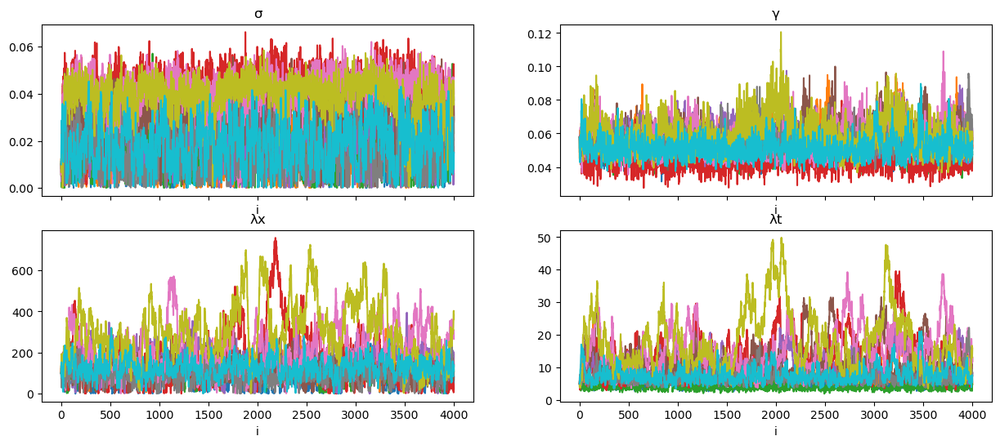

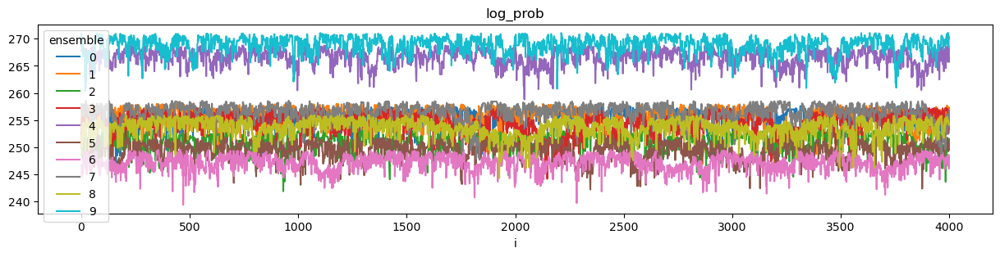

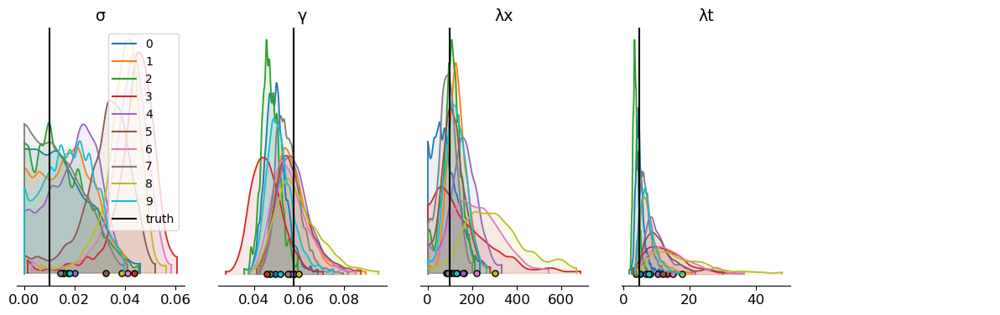

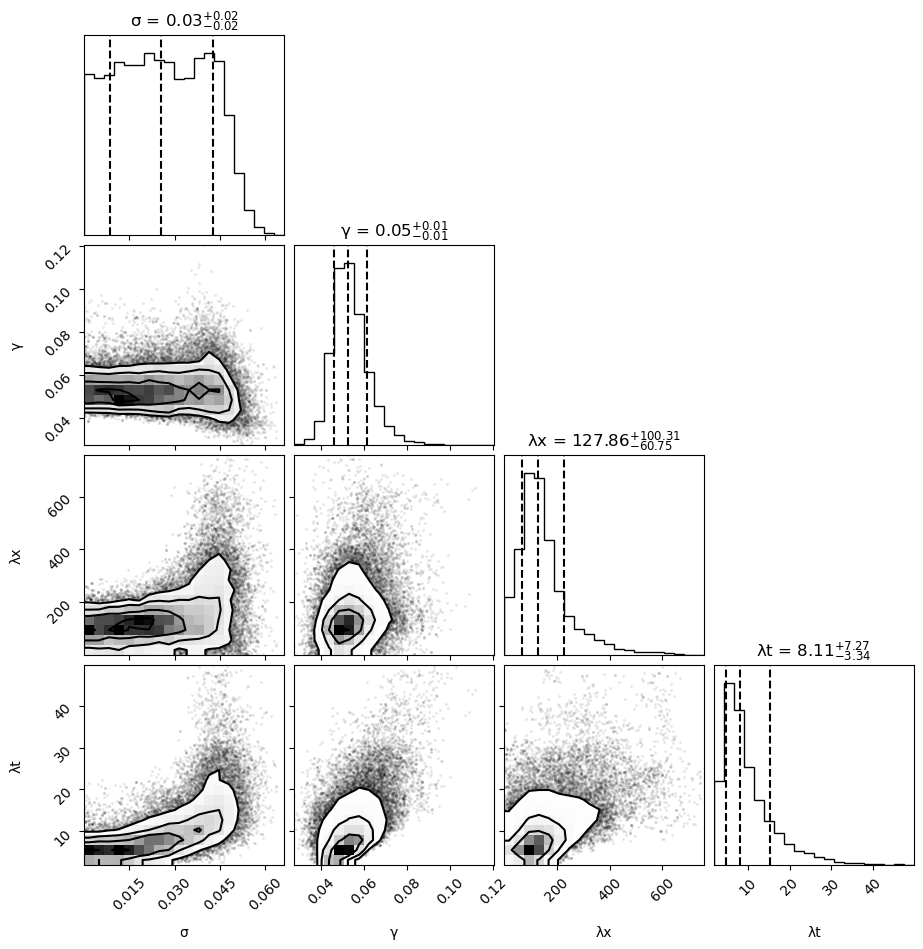

In [10]:
_ds = ds.sel(ensemble=slice(0,10))
traceplots(_ds, MAP=False)
plot_inference(_ds, xlim=False)

#### Empirical convergence metrics 

In [11]:
def show_convergence(ds):
    """ split time series in half and compare mean and std"""

    N = ds["i"].size
    ds0 = ds.isel(i=slice(0,N//2))
    ds0m = ds0.mean(["i"])
    ds0std = ds0.std(["i"])
    ds1 = ds.isel(i=slice(N//2,None))
    ds1m = ds1.mean(["i"])
    ds1std = ds1.std(["i"])

    # mean
    fig, axes = plt.subplots(ds.parameter.size,1,figsize=(5,5), sharex=True,)
    for p, ax in zip(ds.parameter.values, axes):
        _da = ds0m.sel(parameter=p).samples
        _da.plot(ax=ax)
        _da = ds1m.sel(parameter=p).samples
        _da.plot(ax=ax)
        ax.set_title(p+" mean")
        if p!=ds.parameter.values[-1]:
            ax.set_xlabel("")
    plt.subplots_adjust(hspace=0.5)

    # mean
    fig, axes = plt.subplots(ds.parameter.size,1,figsize=(5,5), sharex=True,)
    for p, ax in zip(ds.parameter.values, axes):
        _da = ds0std.sel(parameter=p).samples
        _da.plot(ax=ax)
        _da = ds1std.sel(parameter=p).samples
        _da.plot(ax=ax)
        ax.set_title(p+" std")
        if p!=ds.parameter.values[-1]:
            ax.set_xlabel("")
    plt.subplots_adjust(hspace=0.5)



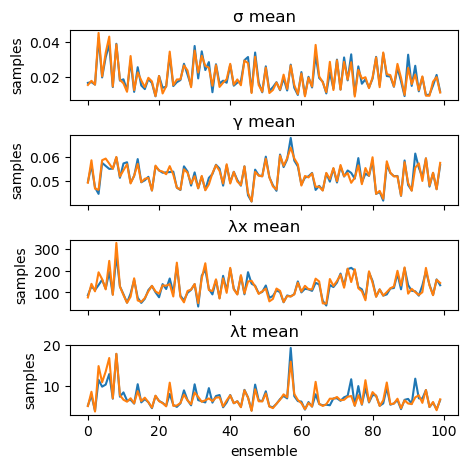

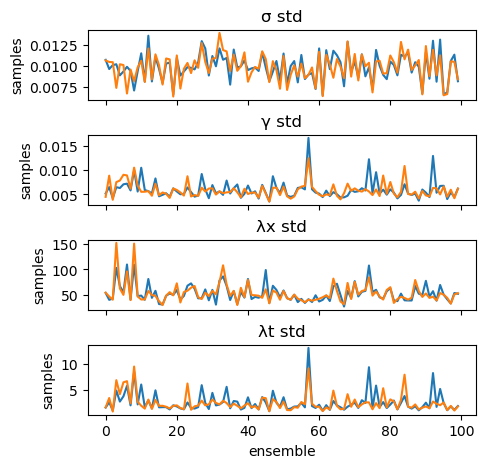

In [12]:
show_convergence(ds)

#### Effective sample size

In [13]:
samples = ds.samples.isel(ensemble=0).values
samples_az = convert_to_az(samples, labels)
Ndof = az.ess(samples_az)
print(Ndof)

<xarray.Dataset>
Dimensions:  ()
Data variables:
    σ        float64 158.4
    γ        float64 457.7
    λx       float64 92.88
    λt       float64 201.5


#### MAP

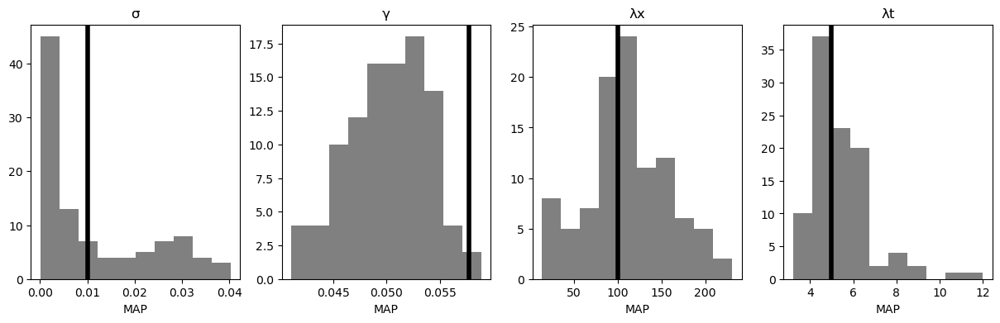

In [14]:
fig, axes = plt.subplots(1, ds.parameter.size, figsize=(15,4))

for p, ax in zip(ds.parameter, axes):
    _ds = ds.sel(parameter=p)
    _tr = float(_ds.true_parameters.isel(ensemble=0))
    _ds.MAP.plot.hist(ax=ax, bins=10, color="0.5")
    ax.set_title(str(p.values)) #+ " - MAP"
    ax.axvline(_tr, color="k", lw=4)

#### mean/std

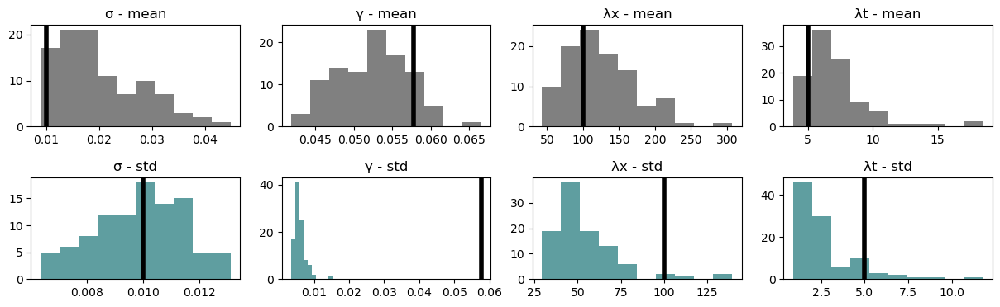

In [15]:
fig, axes = plt.subplots(2, ds.parameter.size, figsize=(15,4), gridspec_kw=dict(hspace=.5))

# mean
for p, ax in zip(ds.parameter, axes[0,:]):
    _ds = ds.sel(parameter=p).isel(i=slice(i_burn,None))
    _da = _ds.samples.mean("i")
    _da.plot.hist(ax=ax, bins=10, color="0.5")
    ax.set_title(str(p.values)+" - mean")
    _tr = float(_ds.true_parameters.isel(ensemble=0))
    ax.axvline(_tr, color="k", lw=4)
    ax.set_xlabel("")
    
# std
for p, ax in zip(ds.parameter, axes[1,:]):
    _ds = ds.sel(parameter=p).isel(i=slice(i_burn,None))
    _da = _ds.samples.std("i")
    _da.plot.hist(ax=ax, bins=10, color="cadetblue")
    ax.set_title(str(p.values)+ " - std")
    _tr = float(_ds.true_parameters.isel(ensemble=0))
    ax.axvline(_tr, color="k", lw=4)
    ax.set_xlabel("")

#### quantiles

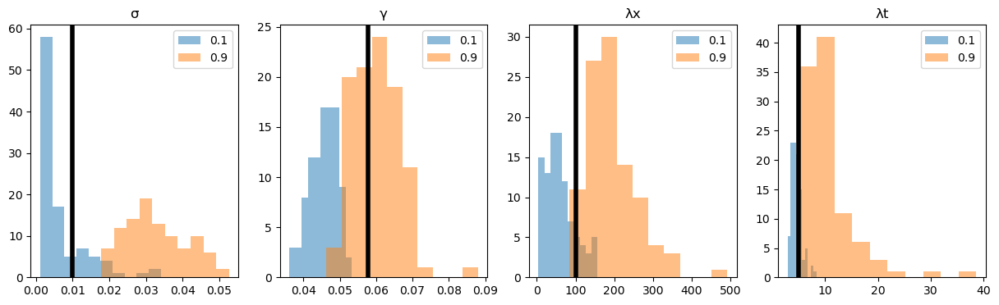

In [16]:
fig, axes = plt.subplots(1, ds.parameter.size, figsize=(15,4))

qt = [0.1, 0.9]

for p, ax in zip(ds.parameter, axes):
    _ds = ds.sel(parameter=p)
    _da = _ds.samples.quantile(qt, dim="i")
    _tr = float(_ds.true_parameters.isel(ensemble=0))
    for q in qt:
        _da.sel(quantile=q).plot.hist(ax=ax, bins=10, alpha=.5, label=f"{q}")
    ax.axvline(_tr, color="k", lw=4)
    ax.set_title(str(p.values))
    ax.set_xlabel("")
    ax.legend()

##### quantiles 0.1 0.9 difference

this larger than std by a factor of about 2

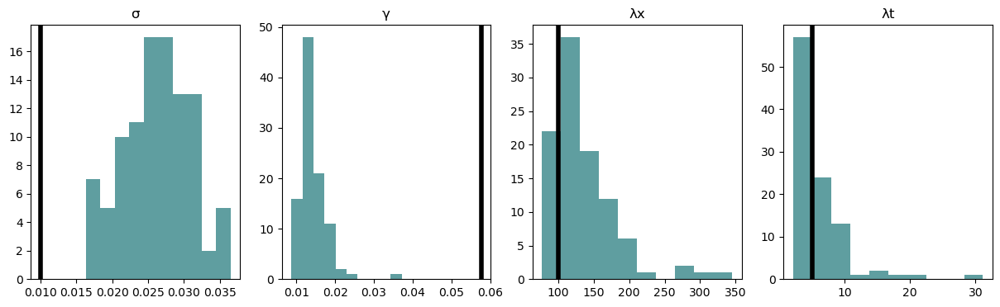

In [17]:
fig, axes = plt.subplots(1, ds.parameter.size, figsize=(15,4))

qt = [0.1, 0.9]

for p, ax in zip(ds.parameter, axes):
    _ds = ds.sel(parameter=p)
    _da = _ds.samples.quantile(qt, dim="i")
    _tr = float(_ds.true_parameters.isel(ensemble=0))
    _da = _da.sel(quantile=qt[1]) - _da.sel(quantile=qt[0])
    _da.plot.hist(ax=ax, bins=10, color="cadetblue")
    ax.axvline(_tr, color="k", lw=4)
    ax.set_title(str(p.values))
    ax.set_xlabel("")

---
## drifter inference

- Lagrangian simulation
- actual inference


In [18]:
# dev
#ds = st.run_drifter_ensembles(data_dir, case, Ne, covparams, covfunc, labels, (Nt, Nxy), noise, n_mcmc=100) # dev: delete None

In [19]:
nc = os.path.join(data_dir, case+f"_drifters_ensemble_Nxy{Nxy}.nc")
if dx is not None:
    nc = nc.replace(".nc", f"_dx{dx:0.0f}.nc")
if traj_decorrelation:
    nc = nc.replace(".nc", f"_trajd.nc")

if prod:
    ds = st.run_drifter_ensembles(data_dir, case, Ne, covparams, covfunc, labels, (Nt, Nxy), noise, dx=dx)
    ds.to_netcdf(nc, mode="w")
else:
    ds = xr.open_dataset(nc)

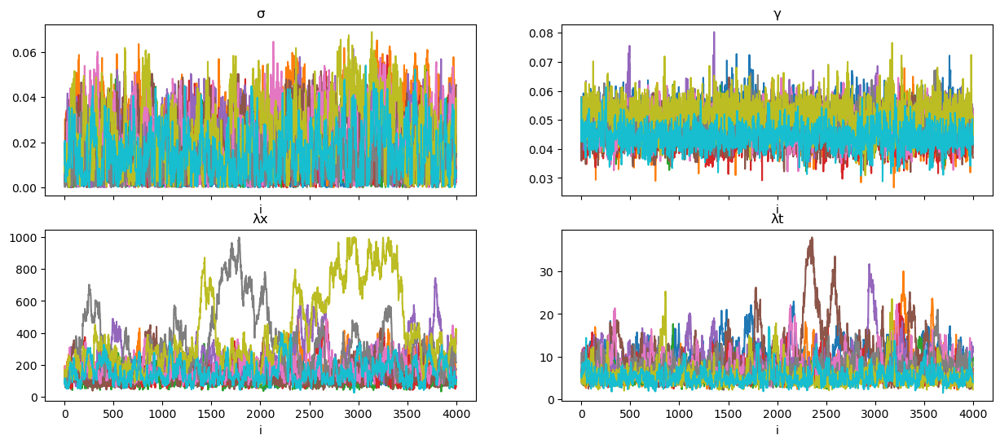

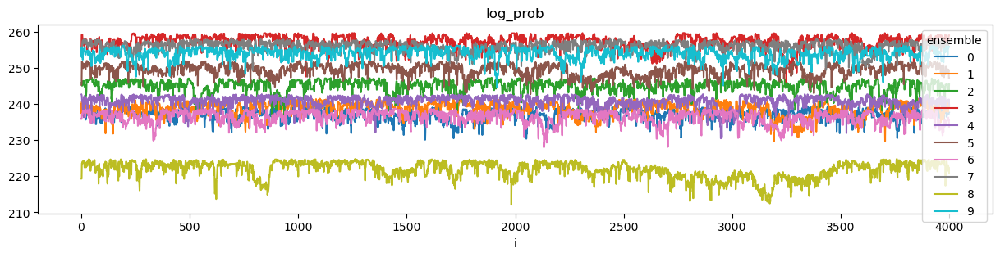

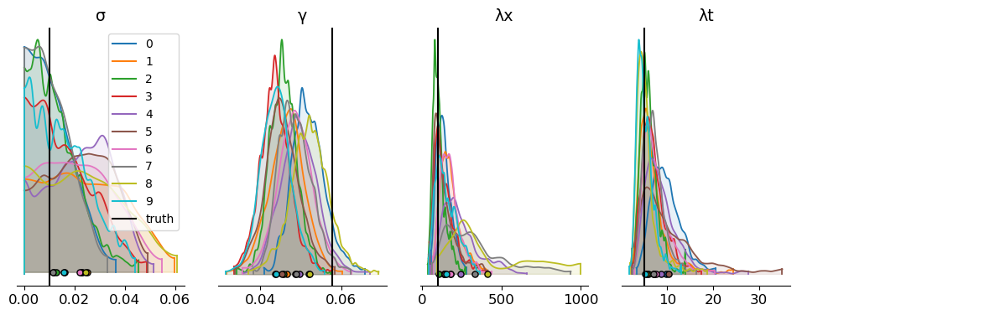

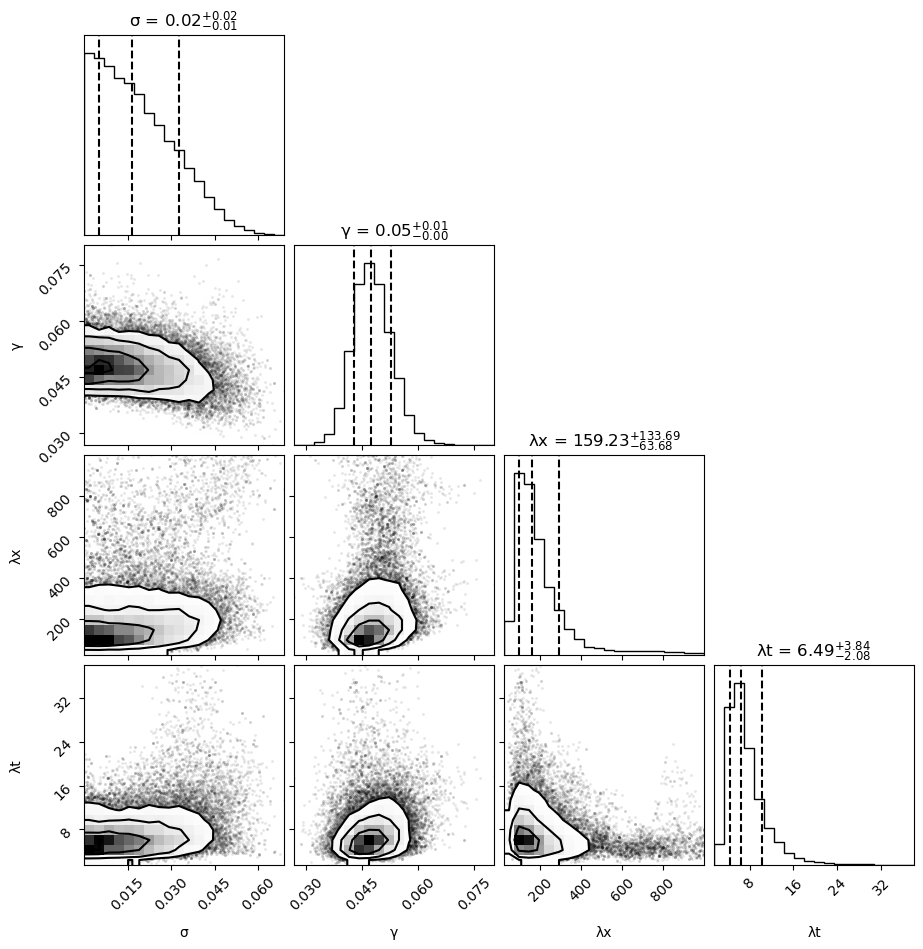

In [20]:
_ds = ds.sel(ensemble=slice(0,10))
traceplots(_ds, MAP=False)
plot_inference(_ds, xlim=False)

#### MAP

The underestimation of $\gamma$ may be related to interference with the noise parameter inference (see joint distributions above) and the fact we allow for substantial values of the noise compared to the $\gamma$ ... to be verified

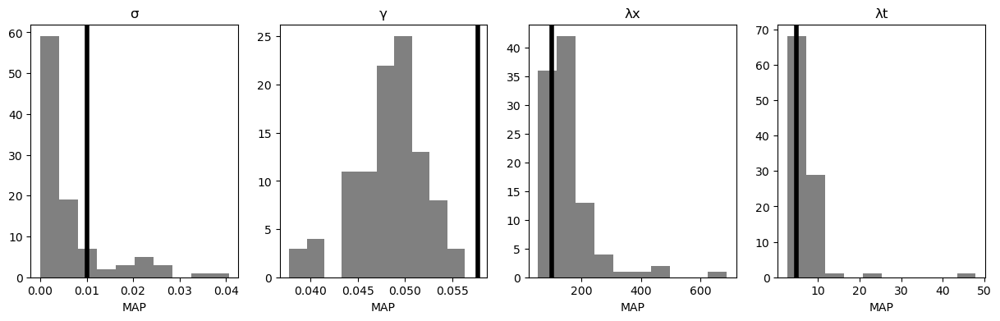

In [21]:
fig, axes = plt.subplots(1, ds.parameter.size, figsize=(15,4))

for p, ax in zip(ds.parameter, axes):
    _ds = ds.sel(parameter=p)
    _tr = float(_ds.true_parameters.isel(ensemble=0))
    _ds.MAP.plot.hist(ax=ax, bins=10, color="0.5")
    ax.set_title(str(p.values)) #+ " - MAP"
    ax.axvline(_tr, color="k", lw=4)

#### mean/std

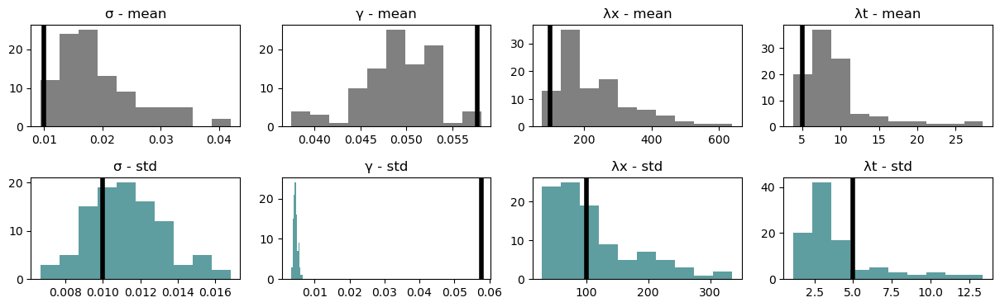

In [22]:
fig, axes = plt.subplots(2, ds.parameter.size, figsize=(15,4), gridspec_kw=dict(hspace=.5))

# mean
for p, ax in zip(ds.parameter, axes[0,:]):
    _ds = ds.sel(parameter=p).isel(i=slice(i_burn,None))
    _da = _ds.samples.mean("i")
    _da.plot.hist(ax=ax, bins=10, color="0.5")
    ax.set_title(str(p.values)+" - mean")
    _tr = float(_ds.true_parameters.isel(ensemble=0))
    ax.axvline(_tr, color="k", lw=4)
    ax.set_xlabel("")
    
# std
for p, ax in zip(ds.parameter, axes[1,:]):
    _ds = ds.sel(parameter=p).isel(i=slice(i_burn,None))
    _da = _ds.samples.std("i")
    _da.plot.hist(ax=ax, bins=10, color="cadetblue")
    ax.set_title(str(p.values)+ " - std")
    _tr = float(_ds.true_parameters.isel(ensemble=0))
    ax.axvline(_tr, color="k", lw=4)
    ax.set_xlabel("")

#### quantiles

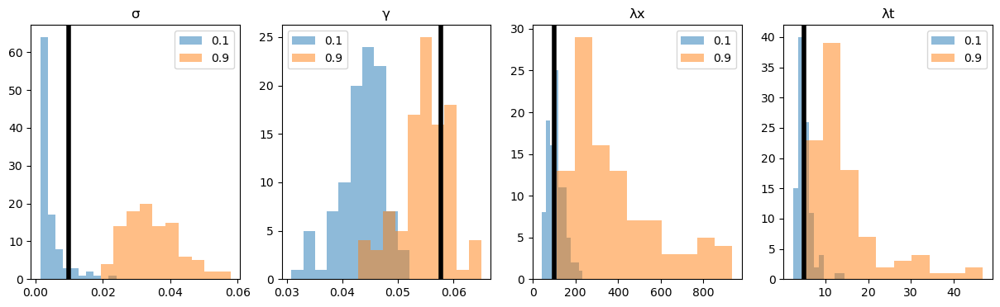

In [23]:
fig, axes = plt.subplots(1, ds.parameter.size, figsize=(15,4))

qt = [0.1, 0.9]

for p, ax in zip(ds.parameter, axes):
    _ds = ds.sel(parameter=p)
    _da = _ds.samples.quantile(qt, dim="i")
    _tr = float(_ds.true_parameters.isel(ensemble=0))
    for q in qt:
        _da.sel(quantile=q).plot.hist(ax=ax, bins=10, alpha=.5, label=f"{q}")
    ax.axvline(_tr, color="k", lw=4)
    ax.set_title(str(p.values))
    ax.set_xlabel("")
    ax.legend()

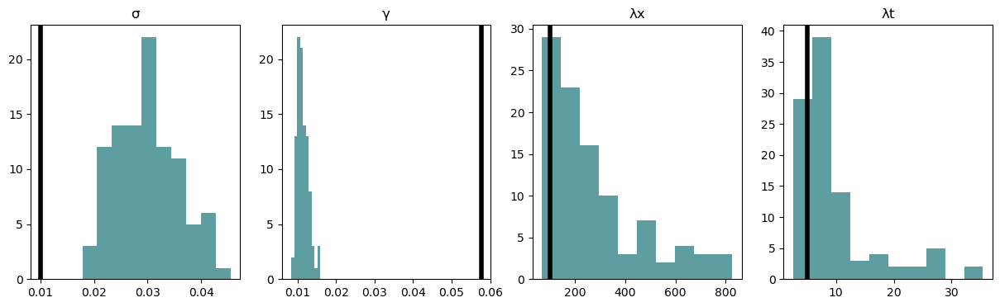

In [24]:
fig, axes = plt.subplots(1, ds.parameter.size, figsize=(15,4))

qt = [0.1, 0.9]

for p, ax in zip(ds.parameter, axes):
    _ds = ds.sel(parameter=p)
    _da = _ds.samples.quantile(qt, dim="i")
    _tr = float(_ds.true_parameters.isel(ensemble=0))
    _da = _da.sel(quantile=qt[1]) - _da.sel(quantile=qt[0])
    _da.plot.hist(ax=ax, bins=10, color="cadetblue")
    ax.axvline(_tr, color="k", lw=4)
    ax.set_title(str(p.values))
    ax.set_xlabel("")

----

In [25]:
cluster.close()